In [2]:
import os
import collections
import pandas as pd
import numpy as np
import functools
import matplotlib.pyplot as plt
import cv2

from sklearn import preprocessing 


import xml.etree.ElementTree as ET

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data import SequentialSampler

In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

In [4]:
import torch
import torchvision
from torchvision import datasets, models
from torchvision.transforms import functional as FT
from torchvision import transforms as T
from torch import nn, optim
from torch.nn import functional as F
from torch.utils.data import DataLoader, sampler, random_split, Dataset
import copy
import math
from PIL import Image
import cv2
import albumentations as A  # our data augmentation library

import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
import warnings
warnings.filterwarnings("ignore")
from collections import defaultdict, deque
import datetime
import time
from tqdm import tqdm # progress bar
from torchvision.utils import draw_bounding_boxes

In [6]:
from pycocotools.coco import COCO

In [7]:
from albumentations.pytorch import ToTensorV2

In [8]:
BASE_PATH = "data/VisDrone2019-DET-test-dev"
XML_PATH = os.path.join(BASE_PATH, "annotations_new")
IMG_PATH = os.path.join(BASE_PATH, "images_new")
XML_FILES = [os.path.join(XML_PATH, f) for f in os.listdir(XML_PATH)]

In [9]:
class XmlParser(object):

    def __init__(self,xml_file):

        self.xml_file = xml_file
        self._root = ET.parse(self.xml_file).getroot()
        self._objects = self._root.findall("object")
        # path to the image file as describe in the xml file
        self.img_path = os.path.join(IMG_PATH, self._root.find('filename').text)
        # image id 
        self.image_id = self._root.find("filename").text
        # names of the classes contained in the xml file
        self.names = self._get_names()
        # coordinates of the bounding boxes
        self.boxes = self._get_bndbox()

    def parse_xml(self):
        """"Parse the xml file returning the root."""
    
        tree = ET.parse(self.xml_file)
        return tree.getroot()

    def _get_names(self):

        names = []
        for obj in self._objects:
            name = obj.find("name")
            names.append(name.text)

        return np.array(names)

    def _get_bndbox(self):

        boxes = []
        for obj in self._objects:
            coordinates = []
            bndbox = obj.find("bndbox")
            coordinates.append(np.int32(bndbox.find("xmin").text))
            coordinates.append(np.int32(np.float32(bndbox.find("ymin").text)))
            coordinates.append(np.int32(bndbox.find("xmax").text))
            coordinates.append(np.int32(bndbox.find("ymax").text))
            boxes.append(coordinates)

        return np.array(boxes)

In [10]:
def xml_files_to_df(xml_files):
    
    """"Return pandas dataframe from list of XML files."""
    
    names = []
    boxes = []
    image_id = []
    xml_path = []
    img_path = []
    for file in xml_files:
        xml = XmlParser(file)
        names.extend(xml.names)
        boxes.extend(xml.boxes)
        image_id.extend([xml.image_id] * len(xml.names))
        xml_path.extend([xml.xml_file] * len(xml.names))
        img_path.extend([xml.img_path] * len(xml.names))
    a = {"image_id": image_id,
         "names": names,
         "boxes": boxes,
         "xml_path":xml_path,
         "img_path":img_path}
    
    df = pd.DataFrame.from_dict(a, orient='index')
    df = df.transpose()
    
    return df

df = xml_files_to_df(XML_FILES)
df.head()

,image_id,names,boxes,xml_path,img_path
0,0000006_00159_d_0000001.jpg,Car,"[685, 463, 795, 528]",data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...
1,0000006_00159_d_0000001.jpg,Car,"[578, 328, 614, 366]",data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...
2,0000006_00159_d_0000001.jpg,Car,"[617, 327, 655, 371]",data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...
3,0000006_00159_d_0000001.jpg,Car,"[659, 350, 749, 390]",data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...
4,0000006_00159_d_0000001.jpg,Car,"[761, 346, 801, 390]",data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...


In [11]:
# check values for per class
df['names'].value_counts()

Car                28074
Pedestrian         21006
People              6376
Motor               5845
Van                 5771
Bus                 2940
Truck               2659
Ignore              2180
Bicycle             1302
Awning-tricycle      599
Tricycle             530
Others               265
Name: names, dtype: int64

In [12]:
# remove .jpg extension from image_id 
df['img_id'] = df['image_id'].apply(lambda x:x.split('.')).map(lambda x:x[0])
df.drop(columns=['image_id'], inplace=True)
df.head()

,names,boxes,xml_path,img_path,img_id
0,Car,"[685, 463, 795, 528]",data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...,0000006_00159_d_0000001
1,Car,"[578, 328, 614, 366]",data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...,0000006_00159_d_0000001
2,Car,"[617, 327, 655, 371]",data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...,0000006_00159_d_0000001
3,Car,"[659, 350, 749, 390]",data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...,0000006_00159_d_0000001
4,Car,"[761, 346, 801, 390]",data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...,0000006_00159_d_0000001


In [13]:
# classes need to be in int form so we use LabelEncoder for this task
enc = preprocessing.LabelEncoder()
df['labels'] = enc.fit_transform(df['names'])
df['labels'] = np.stack(df['labels'][i]+1 for i in range(len(df['labels']))) 

In [14]:
classes = df[['names','labels']].value_counts()
classes

names            labels
Car              4         28074
Pedestrian       8         21006
People           9          6376
Motor            6          5845
Van              12         5771
Bus              3          2940
Truck            11         2659
Ignore           5          2180
Bicycle          2          1302
Awning-tricycle  1           599
Tricycle         10          530
Others           7           265
dtype: int64

In [15]:
len(classes)

12

In [16]:
classes= {1:'Car',2:'Pedestrian',3:'People',4:'Motor',5:'Van',6:'Bus',7:'Truck',8:'Ignore',9:'Bicycle',10:'Awning-tricycle',11:'Tricycle',12:'Others'}

In [17]:
df['xmin'] = -1
df['ymin'] = -1
df['xmax'] = -1
df['ymax'] = -1

df[['xmin','ymin','xmax','ymax']]=np.stack(df['boxes'][i] for i in range(len(df['boxes'])))

df.drop(columns=['boxes'], inplace=True)
df['xmin'] = df['xmin'].astype(np.float)
df['ymin'] = df['ymin'].astype(np.float)
df['xmax'] = df['xmax'].astype(np.float)
df['ymax'] = df['ymax'].astype(np.float)

In [18]:
# drop names column since we dont need it anymore
df.drop(columns=['names'], inplace=True)
df.head()

,xml_path,img_path,img_id,labels,xmin,ymin,xmax,ymax
0,data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...,0000006_00159_d_0000001,4,685.0,463.0,795.0,528.0
1,data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...,0000006_00159_d_0000001,4,578.0,328.0,614.0,366.0
2,data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...,0000006_00159_d_0000001,4,617.0,327.0,655.0,371.0
3,data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...,0000006_00159_d_0000001,4,659.0,350.0,749.0,390.0
4,data/VisDrone2019-DET-test-dev\annotations_new...,data/VisDrone2019-DET-test-dev\images_new\0000...,0000006_00159_d_0000001,4,761.0,346.0,801.0,390.0


In [19]:
len(df['img_id'].unique())

1610

In [20]:
image_ids = df['img_id'].unique()
valid_ids = image_ids[-600:]
train_ids = image_ids[:-600]
len(train_ids)

1010

In [21]:
valid_df = df[df['img_id'].isin(valid_ids)]
train_df = df[df['img_id'].isin(train_ids)]
valid_df.shape, train_df.shape

((24231, 8), (53316, 8))

In [22]:
class VOCDataset(Dataset):
    
    def __init__(self, dataframe, image_dir, transforms=None):
        super().__init__()
        
        self.image_ids = dataframe['img_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
    
    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        records = self.df[self.df['img_id'] == image_id]
        
        image = cv2.imread(f'{self.image_dir}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        rows, cols = image.shape[:2]
        
        boxes = records[['xmin', 'ymin', 'xmax', 'ymax']].values
        
       
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        
        label = records['labels'].values
        labels = torch.as_tensor(label, dtype=torch.int64)
        
        # suppose all instances are not crowd
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        # target['masks'] = None
        target['image_id'] = torch.tensor([index])
        target['area'] = area
        target['iscrowd'] = iscrowd
        
        if self.transforms:
            sample = {
                'image': image,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            image = sample['image']
            
            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1,0)
            
            return image, target
        
    def __len__(self) -> int:
        return self.image_ids.shape[0]

In [23]:
def get_transform_train():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0)
    ], bbox_params={'format':'pascal_voc', 'label_fields': ['labels']})

def get_transform_valid():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields':['labels']})

In [24]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = VOCDataset(train_df, IMG_PATH , get_transform_train())
valid_dataset = VOCDataset(valid_df, IMG_PATH, get_transform_valid())


# split the dataset in train and test set
indices = torch.randperm(len(train_dataset)).tolist()


train_data_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=0,
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)

In [25]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# FasterRCNN

In [26]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

In [27]:
num_classes = 21

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [28]:
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


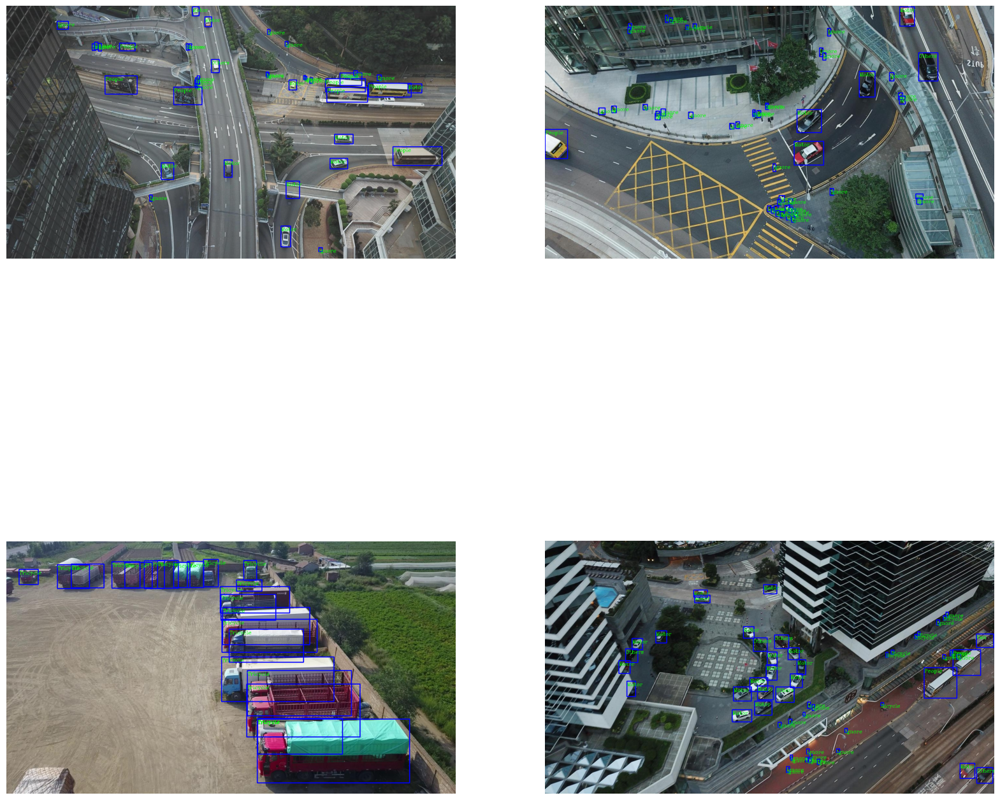

In [29]:
images, targets= next(iter(train_data_loader))
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

plt.figure(figsize=(20,20))
for i, (image, target) in enumerate(zip(images, targets)):
    plt.subplot(2,2, i+1)
    boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
    sample = images[i].permute(1,2,0).cpu().numpy()
    names = targets[i]['labels'].cpu().numpy().astype(np.int64)
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 0, 220), 2)
        cv2.putText(sample, classes[names[i]], (box[0],box[1]+15),cv2.FONT_HERSHEY_COMPLEX ,0.5,(0,220,0),1,cv2.LINE_AA)  

    plt.axis('off')
    plt.imshow(sample)

In [30]:
from engine import train_one_epoch, evaluate
import utils

In [31]:
num_epochs = 1

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, train_data_loader, device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, valid_data_loader, device=device)

Epoch: [0]  [  0/253]  eta: 1:52:57  lr: 0.000025  loss: 6.7454 (6.7454)  loss_classifier: 2.9275 (2.9275)  loss_box_reg: 0.6654 (0.6654)  loss_objectness: 2.6667 (2.6667)  loss_rpn_box_reg: 0.4858 (0.4858)  time: 26.7904  data: 0.3757
Epoch: [0]  [ 10/253]  eta: 1:38:17  lr: 0.000223  loss: 5.2693 (5.3320)  loss_classifier: 2.8229 (2.8088)  loss_box_reg: 0.6898 (0.6892)  loss_objectness: 1.4305 (1.4700)  loss_rpn_box_reg: 0.4061 (0.3640)  time: 24.2704  data: 0.2488
Epoch: [0]  [ 20/253]  eta: 1:32:38  lr: 0.000421  loss: 4.5784 (4.7935)  loss_classifier: 2.6672 (2.6494)  loss_box_reg: 0.6833 (0.6929)  loss_objectness: 0.8649 (1.1086)  loss_rpn_box_reg: 0.3388 (0.3426)  time: 23.7090  data: 0.2468
Epoch: [0]  [ 30/253]  eta: 1:28:15  lr: 0.000619  loss: 3.5311 (4.2535)  loss_classifier: 2.2098 (2.4084)  loss_box_reg: 0.6833 (0.7020)  loss_objectness: 0.3378 (0.8359)  loss_rpn_box_reg: 0.2988 (0.3072)  time: 23.4568  data: 0.2135
Epoch: [0]  [ 40/253]  eta: 1:24:05  lr: 0.000818  loss:

In [32]:
torch.save(model.state_dict(), 'faster_rcnn_state.pth')

In [33]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

WEIGHTS_FILE = "./faster_rcnn_state.pth"

num_classes = 21

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Load the traines weights
model.load_state_dict(torch.load(WEIGHTS_FILE))

model = model.to(device)

# DRNN-RetinaNet

In [34]:
# load a model; pre-trained on COCO
model1 = torchvision.models.detection.retinanet_resnet50_fpn(pretrained=True)

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_coco-eeacb38b.pth" to C:\Users\TruProjects/.cache\torch\hub\checkpoints\retinanet_resnet50_fpn_coco-eeacb38b.pth


  0%|          | 0.00/130M [00:00<?, ?B/s]

In [35]:
num_epochs = 1

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model1, optimizer, train_data_loader, device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model1, valid_data_loader, device=device)

Epoch: [0]  [  0/253]  eta: 0:56:20  lr: 0.000025  loss: 1.7371 (1.7371)  classification: 1.3593 (1.3593)  bbox_regression: 0.3778 (0.3778)  time: 13.3613  data: 0.1166
Epoch: [0]  [ 10/253]  eta: 0:54:40  lr: 0.000223  loss: 1.9092 (1.8986)  classification: 1.2830 (1.3096)  bbox_regression: 0.5915 (0.5890)  time: 13.5000  data: 0.1113
Epoch: [0]  [ 20/253]  eta: 0:53:07  lr: 0.000421  loss: 1.9092 (1.9441)  classification: 1.3422 (1.3271)  bbox_regression: 0.5966 (0.6170)  time: 13.6978  data: 0.1171
Epoch: [0]  [ 30/253]  eta: 0:50:50  lr: 0.000619  loss: 1.9871 (1.9603)  classification: 1.3623 (1.3355)  bbox_regression: 0.5849 (0.6248)  time: 13.7746  data: 0.1186
Epoch: [0]  [ 40/253]  eta: 0:48:29  lr: 0.000818  loss: 1.9118 (1.9292)  classification: 1.2813 (1.3170)  bbox_regression: 0.5682 (0.6122)  time: 13.6364  data: 0.1079
Epoch: [0]  [ 50/253]  eta: 0:46:13  lr: 0.001016  loss: 1.8864 (1.9369)  classification: 1.2827 (1.3206)  bbox_regression: 0.5886 (0.6163)  time: 13.6345 

# CasCaded RCNN

In [38]:
model3 = torchvision.models.detection.keypointrcnn_resnet50_fpn(pretrained=True)

Downloading: "https://download.pytorch.org/models/keypointrcnn_resnet50_fpn_coco-fc266e95.pth" to C:\Users\TruProjects/.cache\torch\hub\checkpoints\keypointrcnn_resnet50_fpn_coco-fc266e95.pth


  0%|          | 0.00/226M [00:00<?, ?B/s]

In [39]:
num_epochs = 1

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, train_data_loader, device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, valid_data_loader, device=device)

Epoch: [0]  [  0/253]  eta: 1:03:49  lr: 0.000000  loss: 6.0617 (6.0617)  loss_classifier: 1.2702 (1.2702)  loss_box_reg: 0.3147 (0.3147)  loss_objectness: 3.7707 (3.7707)  loss_rpn_box_reg: 0.7062 (0.7062)  time: 15.1354  data: 0.1326
Epoch: [0]  [ 10/253]  eta: 0:59:46  lr: 0.000000  loss: 4.4999 (4.6706)  loss_classifier: 1.1245 (1.1325)  loss_box_reg: 0.2722 (0.2707)  loss_objectness: 2.6706 (2.6677)  loss_rpn_box_reg: 0.5778 (0.5998)  time: 14.7589  data: 0.1345
Epoch: [0]  [ 20/253]  eta: 0:57:40  lr: 0.000000  loss: 4.3983 (4.6287)  loss_classifier: 1.1059 (1.1296)  loss_box_reg: 0.2471 (0.2552)  loss_objectness: 2.3368 (2.6301)  loss_rpn_box_reg: 0.5778 (0.6138)  time: 14.8378  data: 0.1347
Epoch: [0]  [ 30/253]  eta: 0:54:54  lr: 0.000001  loss: 4.7326 (4.6829)  loss_classifier: 1.0943 (1.1291)  loss_box_reg: 0.2470 (0.2534)  loss_objectness: 2.6130 (2.6690)  loss_rpn_box_reg: 0.6712 (0.6314)  time: 14.7829  data: 0.1313
Epoch: [0]  [ 40/253]  eta: 0:52:30  lr: 0.000001  loss:

# MaskRCNN

In [40]:
import pixellib
from pixellib.instance import instance_segmentation
segment_image = instance_segmentation()
segment_image.load_model("mask_rcnn_coco.h5") 

Instructions for updating:
Use fn_output_signature instead


Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Processed image saved successfully in your current working directory.


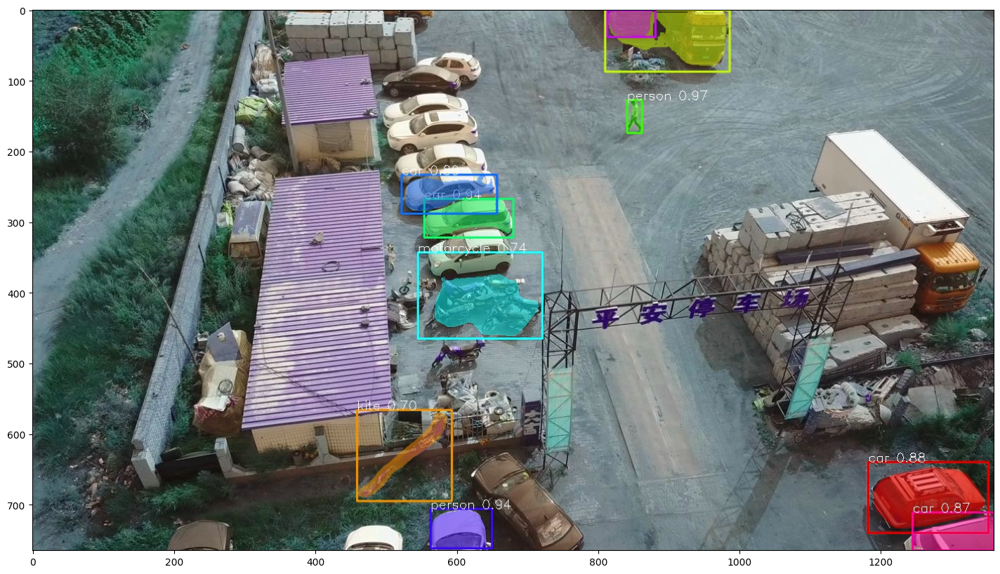

In [41]:
segment_image.segmentImage("data/VisDrone2019-DET-test-dev/images_new/0000006_01275_d_0000004.jpg", output_image_name = "output_1.jpg",show_bboxes = True)
image=cv2.imread("output_1.jpg")
plt.rcParams["figure.figsize"] = (50,10)
plt.imshow(image)
plt.show()

Processed image saved successfully in your current working directory.


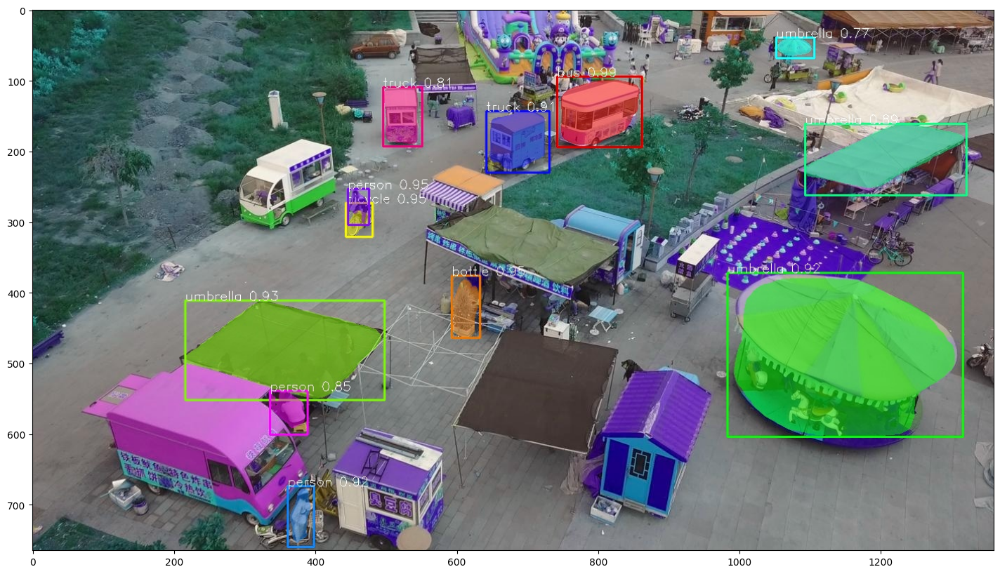

In [42]:
segment_image.segmentImage("data/VisDrone2019-DET-test-dev/images_new/0000011_04202_d_0000007.jpg", output_image_name = "output_4.jpg",show_bboxes = True)
image=cv2.imread("output_4.jpg")
plt.imshow(image)
plt.show()

In [43]:
def obj_detector(img):
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)


    img /= 255.0
    img = torch.from_numpy(img)
    img = img.unsqueeze(0)
    img = img.permute(0,3,1,2)
    
    model.eval()

    detection_threshold = 0.70
    
    img = list(im.to(device) for im in img)
    output = model(img)

    for i , im in enumerate(img):
        boxes = output[i]['boxes'].data.cpu().numpy()
        scores = output[i]['scores'].data.cpu().numpy()
        labels = output[i]['labels'].data.cpu().numpy()

        labels = labels[scores >= detection_threshold]
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        scores = scores[scores >= detection_threshold]

        boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
        boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
    
    sample = img[0].permute(1,2,0).cpu().numpy()
    sample = np.array(sample)
    boxes = output[0]['boxes'].data.cpu().numpy()
    name = output[0]['labels'].data.cpu().numpy()
    scores = output[0]['scores'].data.cpu().numpy()
    boxes = boxes[scores >= detection_threshold].astype(np.int32)
    names = name.tolist()
    
    return names, boxes, sample

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


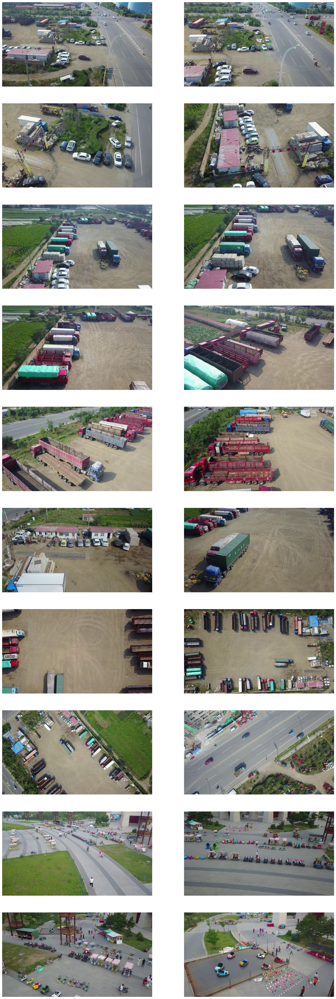

In [46]:
pred_path = "data/VisDrone2019-DET-test-dev/images"
pred_files = [os.path.join(pred_path,f) for f in os.listdir(pred_path)]

plt.figure(figsize=(20,60))
for i, images in enumerate(pred_files):
    if i > 19:break
    plt.subplot(10,2,i+1)
    names,boxes,sample = obj_detector(images)
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 220, 0), 2)
        cv2.putText(sample, classes[names[i]], (box[0],box[1]-5),cv2.FONT_HERSHEY_COMPLEX ,0.7,(220,0,0),1,cv2.LINE_AA)  

    plt.axis('off')
    plt.imshow(sample)
#     plt.savefig('save_image.png', bbox_inches='tight')  # if you want to save result